In [1]:
import os
import pandas as pd
import numpy as np
#import umap
#import umap.plot
import xgboost
import shap
import pickle
#from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
#from sklearn.datasets import fetch_openml
#from sklearn.datasets import fetch_kddcup99
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.max_rows = 125
pd.options.display.max_columns = 400
pd.options.display.max_categories = 400
pd.options.display.max_seq_items = 400
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from sklearn.datasets import fetch_kddcup99

In [2]:
#%%script false --no-raise-error 
if not os.path.exists("kdd99_dummified.parquet"):
    kdd99 = fetch_openml(data_id=42746).frame # version:5 full dataset with almost 5 mio rows (4.898.431)
    kdd99_dummified = pd.get_dummies(kdd99, columns=['protocol_type', 'service', 'flag'], drop_first=False)
    #kdd99_dummified.rename({"is_host_login":"is_hot_login"},axis=1,inplace=True) # is_host_login belongs to "hot" logins ...
    print("rows, columns after one-hot-encoding:", kdd99_dummified.shape)
    print("creating file: kdd99_dummified.parquet")
    kdd99_dummified.to_parquet("kdd99_dummified.parquet") # 11MiB on disk vs 1.6GiB in memory
else:
    print("file: kdd99_dummified.parquet already exists. Loading from parquet file.")
    kdd99_dummified = pd.read_parquet("kdd99_dummified.parquet")
    
#kdd99_dummified['target'] = pd.Series(kdd99_dummified['target'].replace("normal.","xnormal.").to_numpy()) # to_numpy to reorder xnormal to the end
#kdd99_dummified['target'] = kdd99_dummified['target'].astype('category')
#le = sklearn.preprocessing.LabelEncoder()
#target_numeric = le.fit_transform(kdd99_dummified['target'])
target = kdd99_dummified['target']
print('\ntarget value distribution: ')
for idx in kdd99_dummified['target'].value_counts().index.values.to_list(): print( str(idx), kdd99_dummified["target"].value_counts()[idx], end='; ')

kdd99_dummified.drop("target", axis=1, inplace=True)

kdd99_dummified = kdd99_dummified.astype({'land': np.uint8, 'logged_in': np.uint8, 'root_shell': np.uint8, 'su_attempted': np.uint8, 'is_host_login': np.uint8, 'is_guest_login': np.uint8}) # change from category type

# make target a binary variable: normal==0 anomaly==1
targets_x = np.where( target.to_numpy() == 'normal.', 0, 1)
print('\n\nanomalies:', targets_x.sum(), 'percent:',100*targets_x.sum()/targets_x.shape[0] )

file: kdd99_dummified.parquet already exists. Loading from parquet file.

target value distribution: 
smurf. 2807886; neptune. 1072017; normal. 972781; satan. 15892; ipsweep. 12481; portsweep. 10413; nmap. 2316; back. 2203; warezclient. 1020; teardrop. 979; pod. 264; guess_passwd. 53; buffer_overflow. 30; land. 21; warezmaster. 20; imap. 12; rootkit. 10; loadmodule. 9; ftp_write. 8; multihop. 7; phf. 4; perl. 3; spy. 2; 

anomalies: 3925650 percent: 80.14096758737645


In [3]:
%%script false --no-raise-error 
# for faster plotting, less overplotting: smaller dataset: kdd99 10%

kdd99_10 = fetch_kddcup99()
kdd99_10_df = pd.DataFrame(kdd99_10.data, columns=kdd99_10.feature_names)
kdd99_10_df.drop(  ['num_outbound_cmds'] , axis=1, inplace=True)
kdd99_10_dummified = pd.get_dummies(kdd99_10_df, columns=['protocol_type', 'service', 'flag'], dtype=np.uint8)
kdd99_10_dummified = kdd99_10_dummified.astype(np.float32)
targets_x = np.array([str(s).replace('normal', 'xnormal').replace("b'", '')[:-2] for s in pd.DataFrame(kdd99_10.target).to_numpy().reshape(-1) ]) # for plotting: make the normal class the last one (in the color scale and plots)
#targets_x = [ i.replace("b'", '')[:-2] for i in targets_x  ]
#kdd99_10_dummified['target'] = targets_x # for plotting, remove before training
targets_x_orig = targets_x
targets_x = np.where( targets_x == 'xnormal', 0, 1)     # make targets binary: normal class: 0 anomaly class: 1
le = sklearn.preprocessing.LabelEncoder()
target_numeric  = le.fit_transform(targets_x_orig)
#kdd99_10_dummified = kdd99_10_dummified.astype({'land': np.uint8, 'logged_in': np.uint8, 'root_shell': np.uint8, 'su_attempted': np.uint8, 'is_host_login': np.uint8, 'is_guest_login': np.uint8})

# set kdd99_dummified = kdd99_10_dummmified
# kdd99_dummified = kdd99_10_dummmified


In [4]:
params = {
    'tree_method':       'gpu_hist',
    'objective':         'binary:logistic', # 'multi:softprob', 'num_class': 23, 
}

In [5]:
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(kdd99_dummified, targets_x, test_size=.25, random_state=2727)

In [6]:
%%time 
epochs = 200
if os.path.exists('xgboost_model_' + str(epochs) + '_rounds.pickle'):
    model = pickle.load(open('xgboost_model_' + str(epochs) + '_rounds.pickle', "rb"))
    print('loading model from pickle:', epochs)
    train = xgboost.DMatrix(x_train, label=y_train)
    test  = xgboost.DMatrix(x_test, label=y_test)
else:
    train = xgboost.DMatrix(x_train, label=y_train)
    test  = xgboost.DMatrix(x_test, label=y_test)
    evals = [(test, 'test'), (train, 'train')]
    model = xgboost.train(params, train, epochs, evals=evals)
    #model.save_model('xgboost.json')
    pickle.dump(model, open('xgboost_model_' + str(epochs) + '_rounds.pickle', "wb"))

loading model from pickle: 200
CPU times: user 9.87 s, sys: 1.68 s, total: 11.5 s
Wall time: 6.19 s


In [7]:
# stats for training data:

preds = model.predict(train)
#pred_labels = np.argmax(preds, axis=1)
pred_labels = np.where(preds < 0.5, 0, 1)
true_labels = y_train
print('accuracy:', sklearn.metrics.accuracy_score(true_labels, pred_labels))
print('precision:',sklearn.metrics.precision_score(true_labels,pred_labels))
print('recall:', sklearn.metrics.recall_score(true_labels, pred_labels))
#np.sum((true_labels-pred_labels)==0)/true_labels.shape[0] # accuracy

print('\t\tpredicted\n\t\t0\t1')
print('actual 0: ',sklearn.metrics.confusion_matrix(true_labels, pred_labels)[0])
print('       1: ',sklearn.metrics.confusion_matrix(true_labels, pred_labels)[1])
#print('\t\t0\t1\n\t\tpredicted')
print('predicted anomalies in training data:',np.array(preds > 0.5).sum()/x_train.shape[0],'actual:', y_train.sum()/x_train.shape[0]) # anomalies in training data
print('false positives:', np.sum(true_labels[(true_labels-pred_labels) != 0] == 0)) # misclassified but actual class 0 (normal as anomalies)
print('false negative: ', np.sum(true_labels[(true_labels-pred_labels) != 0] == 1)) # misclassified but actual class 1 (anomalies as normal)

accuracy: 0.9999874789830647
precision: 0.9999996603003556
recall: 0.9999847137444838
		predicted
		0	1
actual 0:  [730001      1]
       1:  [     45 2943776]
predicted anomalies in training data: 0.8012843841415332 actual: 0.8012963607664277
false positives: 1
false negative:  45


In [8]:
# stats for test data:

preds = model.predict(test)
#pred_labels = np.argmax(preds, axis=1) # multiclass
pred_labels = np.where(preds < 0.5, 0, 1) # set < 0.5 to normal class 0
true_labels = y_test
print('accuracy:', sklearn.metrics.accuracy_score(true_labels, pred_labels))
print('precision:',sklearn.metrics.precision_score(true_labels,pred_labels))
print('recall:', sklearn.metrics.recall_score(true_labels, pred_labels))
#np.sum((true_labels-pred_labels)==0)/true_labels.shape[0] # accuracy

print('\t\tpredicted\n\t\t0\t1')
print('actual 0: ',sklearn.metrics.confusion_matrix(true_labels, pred_labels)[0])
print('       1: ',sklearn.metrics.confusion_matrix(true_labels, pred_labels)[1])
#print('\t\t0\t1\n\t\tpredicted')
print('predicted anomalies in training data:',np.array(preds > 0.5).sum()/x_train.shape[0],'actual:', y_train.sum()/x_train.shape[0]) # anomalies in training data
print('false positives:', np.sum(true_labels[(true_labels-pred_labels) != 0] == 0)) # misclassified but actual class 0 (normal as anomalies)
print('false negative: ', np.sum(true_labels[(true_labels-pred_labels) != 0] == 1)) # misclassified but actual class 1 (anomalies as normal)


accuracy: 0.9999567208445478
precision: 0.9999867590410286
recall: 0.9999592597081569
		predicted
		0	1
actual 0:  [242766     13]
       1:  [    40 981789]
predicted anomalies in training data: 0.26724259715288406 actual: 0.8012963607664277
false positives: 13
false negative:  40


In [9]:
# close calls:
x_test[(preds<0.52) & (preds > 0.48)]

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,flag_OTH,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
893420,60.0,87.0,225.0,0,0.0,0.0,0.0,1.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,1.0,1.0,0.00,0.0,0.0,0.0,1.00,0.00,0.0,255.0,1.0,0.00,0.02,0.00,0.00,0.0,0.0,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
845124,0.0,28.0,28.0,0,3.0,0.0,0.0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,101.0,100.0,0.01,0.0,0.0,0.0,0.99,0.02,0.0,255.0,100.0,0.39,0.01,0.39,0.00,0.0,0.0,0.00,0.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3927306,25253.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,1.0,1.0,0.00,0.0,1.0,1.0,1.00,0.00,0.0,83.0,8.0,0.06,0.14,0.13,0.25,0.0,0.0,0.13,0.12,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4867872,10.0,0.0,15.0,0,0.0,0.0,0.0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,1.0,1.0,0.00,0.0,1.0,1.0,1.00,0.00,0.0,1.0,1.0,1.00,0.00,1.00,0.00,0.0,0.0,1.00,1.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


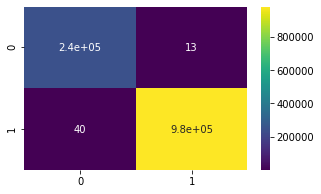

In [10]:
cm = sklearn.metrics.confusion_matrix(true_labels, pred_labels)
x=plt.figure(figsize=(5,3)) 
x=sns.heatmap(cm, annot=True, cmap='viridis')

In [11]:
# DataFrames of misclassified instances
test_miss = x_test.copy()
test_miss['target'] = y_test
test_miss = test_miss[(true_labels-pred_labels) != 0] # misclassified
#test_miss[test_miss['target'] == 0]                   # normal:0 as anomaly
test_miss_normal = test_miss[test_miss['target'] == 0]  # normal
test_miss_anomaly = test_miss[test_miss['target'] == 1] # anomalies

# pick one misclassified instance to analyze: index 845124
test_miss_anomaly.loc[845124][:5] # wrong_fragment == 3 still not classified as teardrop anomaly

duration           0.0
src_bytes         28.0
dst_bytes         28.0
land               0.0
wrong_fragment     3.0
Name: 845124, dtype: float64

# run SHAP (tree) explainer:

In [12]:
%%time
X = x_test
model.set_param({"predictor": "gpu_predictor"})
explainer = shap.Explainer(model)
shap_values = explainer(X)
shap_values_nd = explainer.shap_values(X)
featurenames = kdd99_dummified.columns.to_list()

CPU times: user 12.4 s, sys: 1.22 s, total: 13.6 s
Wall time: 10.3 s


## bar plot of features total effect on prediction:

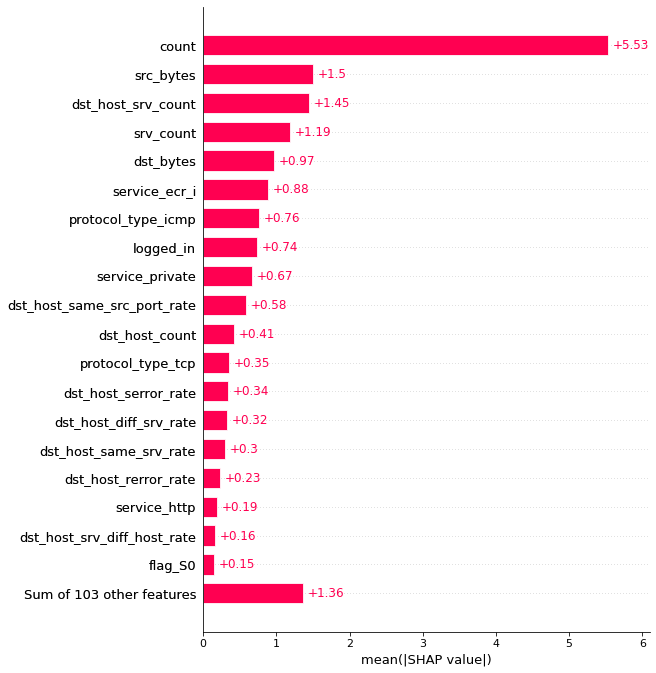

In [13]:
shap.plots.bar(shap_values, max_display=20)

## decision plots to visualize feature importance of the first 1000 test instances

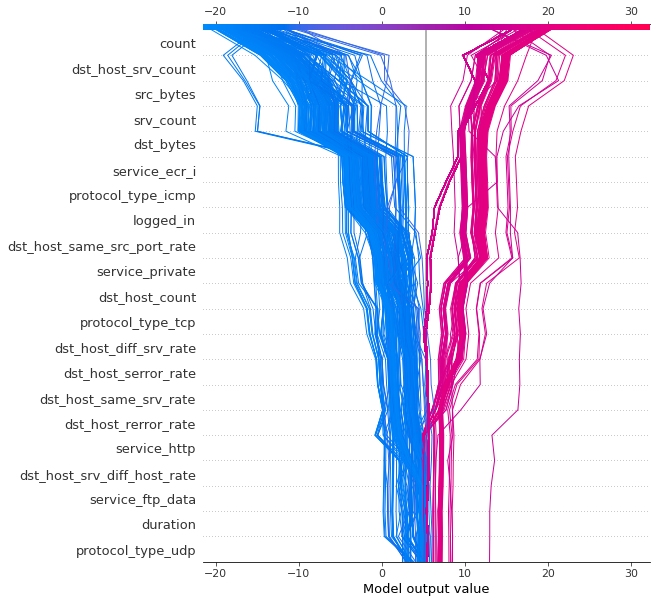

In [14]:
tmp_plot = X.iloc[range(1000)]
features = X.loc[tmp_plot.index] # normal misclassified as a-normal
features_display = X.loc[features.index]
tmp_shap_values = explainer.shap_values(features)
shap.decision_plot(explainer.expected_value, tmp_shap_values, features_display, feature_display_range=slice(-1, -22, -1))

### no trend/pattern for misclassified normal classes, only a few are on left side towards negative value, to be classified as normal

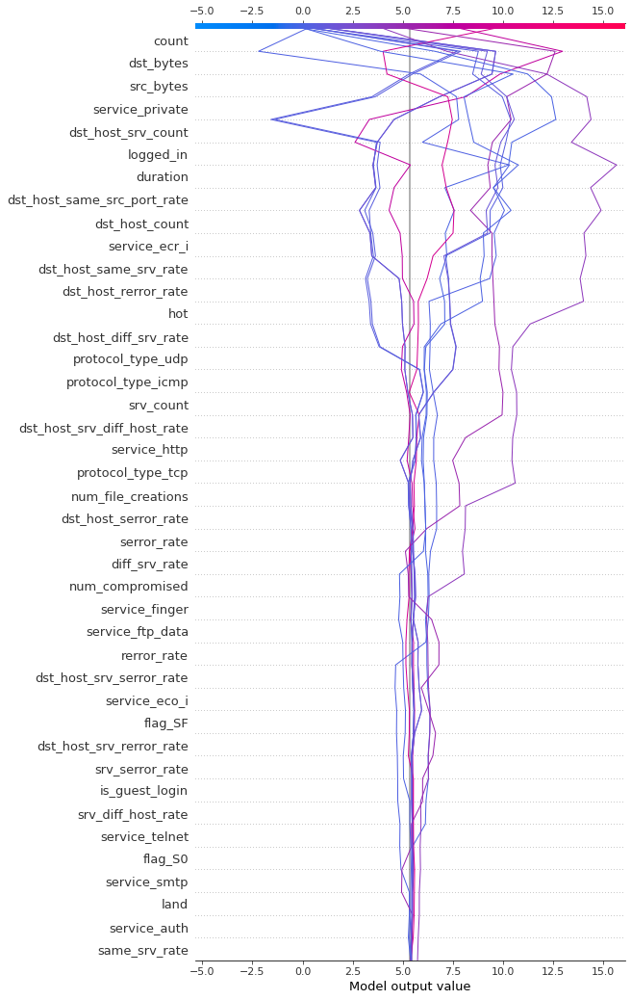

In [15]:
features = X.loc[test_miss_normal.index] # normal misclassified as a-normal
features_display = X.loc[features.index]
tmp_shap_values = explainer.shap_values(features)
shap.decision_plot(explainer.expected_value, tmp_shap_values, features_display, feature_display_range=slice(-1, -42, -1))


### visible pattern for misclassified anomalies: count, dst_bytes, src_bytes push instances to the left

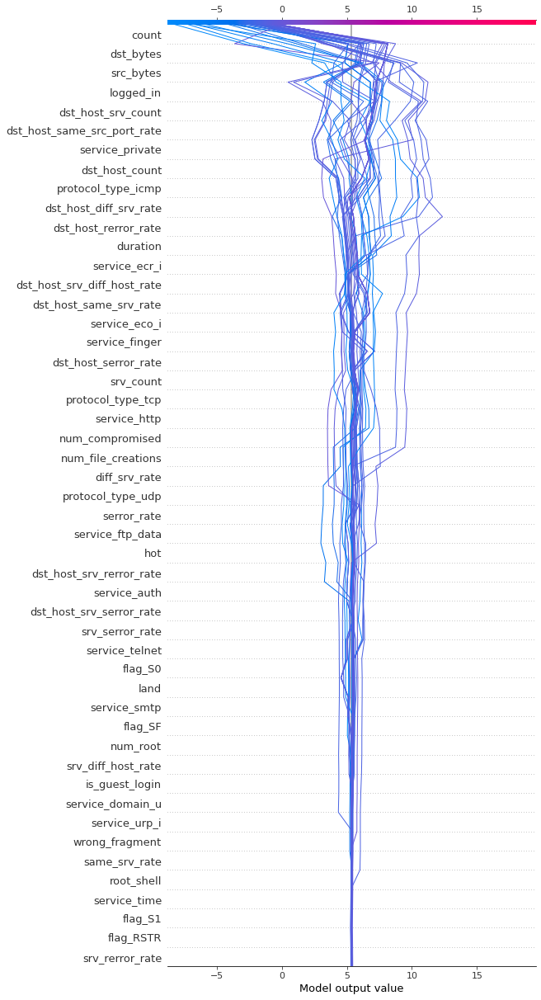

In [16]:
features = X.loc[test_miss_anomaly.index]
features_display = X.loc[test_miss_anomaly.index] # anormal misclassified as normal
tmp_shap_values = explainer.shap_values(features)
shap.decision_plot(explainer.expected_value, tmp_shap_values, features_display,feature_display_range=slice(-1, -50, -1))

## picking one misclassified anomaly: index# 845124 with 0.499 prediction; ~ -0.00135 log-odds on the edge to positive class
### despite fragment=3 like many other teardrop instances not in class1 


In [17]:
print('total shap-effect: sum of shapvalues + base_value in original data:',np.sum(shap_values_nd[X.index.get_loc(845124),:]) + shap_values.base_values[0] )
print('there is a similar instance with class teardrop in the training data:')
#kdd99_dummified[ (kdd99_dummified['target']=='teardrop.') & (kdd99_dummified['dst_bytes'] == 28.0) ] 
# prediction with orig data
preds[x_test.index.get_loc(845124)]
#model.predict( xgboost.DMatrix( x_test.iloc[[x_test.index.get_loc(845124)]] ) ) # same as last line
tmp = x_test.iloc[[x_test.index.get_loc(845124)]].copy()
#tmp['dst_bytes'] = 3 # from 28.0 to 3, 3,2,1 -> predict anomaly 0.99 998236
#tmp['dst_bytes'] = 28.0
#tmp['same_srv_rate'] = 1.00 # instead of 0.99 -> prediction 0.5238
#tmp['count'] = 100 # instead of 101 same prediction
#tmp['serror_rate']=0.0 # same
#tmp['diff_srv_rate']=0 # same
tmp['dst_host_srv_count']=67.0 # 0.9812 !!!
#tmp['dst_host_same_srv_rate']=0.26 # 0.81 !
#tmp['dst_host_same_src_port_rate']=0.26 # 0.5864
print('new prediction:', model.predict( xgboost.DMatrix( tmp ) ))

tmp2 = x_train.iloc[[x_train.index.get_loc(4867838)]].copy()
print('teardrop with dst_bytes = 28 from training data', model.predict( xgboost.DMatrix( tmp2 ) ))
mask = (tmp.to_numpy()-tmp2.to_numpy()).astype(bool)
print('number of different features: ', np.sum(mask))
# false vs correct prediction:
# count = 101 vs 100 | serror_rate 0.01 vs 0.0 | diff_srv_rate 0.02 vs 0.0 | dst_host_srv_count 100 vs 67 | dst_host_same_srv_rate 0.39 vs 0.26 | 
# dst_host_same_src_port_rate 0.39 vs 0.26 
print('differences:')
tmp.where(mask)
print('the misclassified one:')
tmp
print('the correctly classified one from training data:')
tmp2

total shap-effect: sum of shapvalues + base_value in original data: -0.001347065
there is a similar instance with class teardrop in the training data:


0.49966317

new prediction: [0.9525217]
teardrop with dst_bytes = 28 from training data [0.9812645]
number of different features:  6
differences:


,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,flag_OTH,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
845124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.0,NaN,0.01,NaN,NaN,NaN,0.99,0.02,NaN,NaN,NaN,0.39,NaN,0.39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


the misclassified one:


,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,flag_OTH,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
845124,0.0,28.0,28.0,0,3.0,0.0,0.0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,101.0,100.0,0.01,0.0,0.0,0.0,0.99,0.02,0.0,255.0,67.0,0.39,0.01,0.39,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


the correctly classified one from training data:


,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,protocol_type_icmp,protocol_type_tcp,protocol_type_udp,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,flag_OTH,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
4867838,0.0,28.0,28.0,0,3.0,0.0,0.0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,100.0,100.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,255.0,67.0,0.26,0.01,0.26,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


re-run SHAP explainer with modified data (dst_bytes = 3)

In [18]:
print('sum of shapvalues + base_value in original data:',np.sum(shap_values_nd[X.index.get_loc(845124),:]) + shap_values.base_values[0] )
#shap_values_nd[X.index.get_loc(845124),:] same as: shap_values[X.index.get_loc(845124)]

sum of shapvalues + base_value in original data: -0.001347065


### after changing dst_host_srv_count to 67 with prediction 0.9812 you can see the high SHAP influence of dst_bytes


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


67.0

sum of shapvalues modified: [2.99883806]
sum vals  in original data: -0.001347065


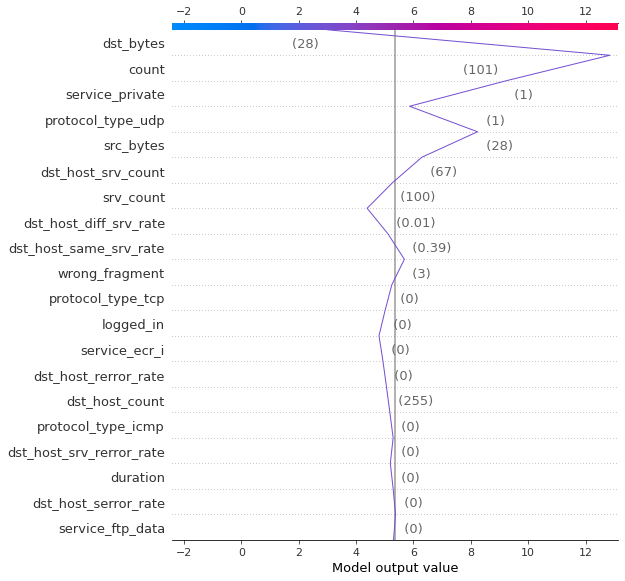

In [19]:
X_mod = X.copy() # X_modified with modified value
#X_mod['dst_bytes'][845124] = 3.0 # change value from 28 to 0 # 8==normal 5==normal 4normal starting with 3 anormal 2,1,0: anomaly
X_mod['dst_host_srv_count'][845124] = 67.0
#X_mod.loc[845124]['dst_bytes']
X_mod['dst_host_srv_count'][845124]

explainer_mod = shap.Explainer(model)
shap_values_mod = explainer(X_mod)
shap_values_nd_mod = explainer.shap_values(X_mod)
features_mod = X_mod.loc[test_miss_anomaly.index] # normal misclassified as anormal
features_display_mod = features_mod
tmp_shap_values_mod = explainer.shap_values(features_mod)
idx = test_miss_anomaly.index.get_loc(845124)
print('sum of shapvalues modified:',np.sum(tmp_shap_values_mod[idx,:]) + explainer_mod.expected_value) # sum relative to base-value/expected value
print('sum vals  in original data:',np.sum(shap_values_nd[X.index.get_loc(845124),:]) + explainer.expected_value) 
shap.decision_plot(explainer_mod.expected_value, tmp_shap_values_mod[idx,:], features_display_mod.loc[845124], )

In [20]:
#featurenames.remove('target')

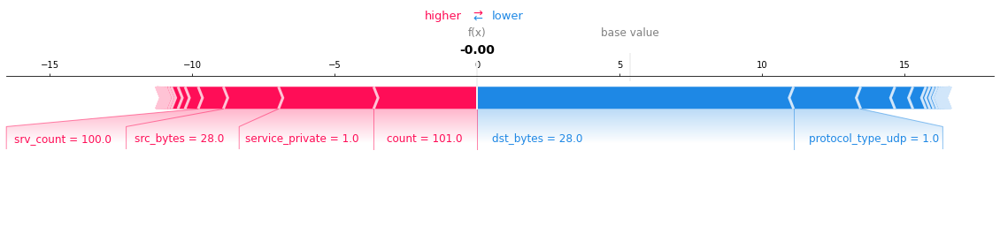

class: 1


In [21]:
point = x_test.index.get_loc(845124)
shap.force_plot(
    explainer.expected_value,
    shap_values_nd[point, :],
    X.to_numpy()[point, :],
    feature_names= featurenames,
    matplotlib=True
)
print('class:',y_test[x_test.index.get_loc(845124)])

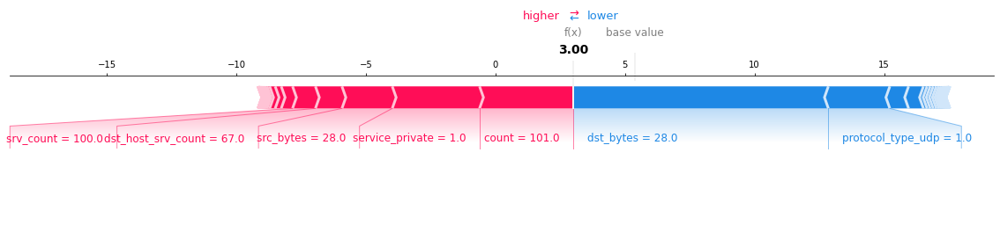

class: 1


In [22]:
point = x_test.index.get_loc(845124)
shap.force_plot(
    explainer_mod.expected_value,
    shap_values_nd_mod[point, :],
    X_mod.to_numpy()[point, :],
    feature_names= featurenames,
    matplotlib=True
)
print('class:',y_test[x_test.index.get_loc(845124)])

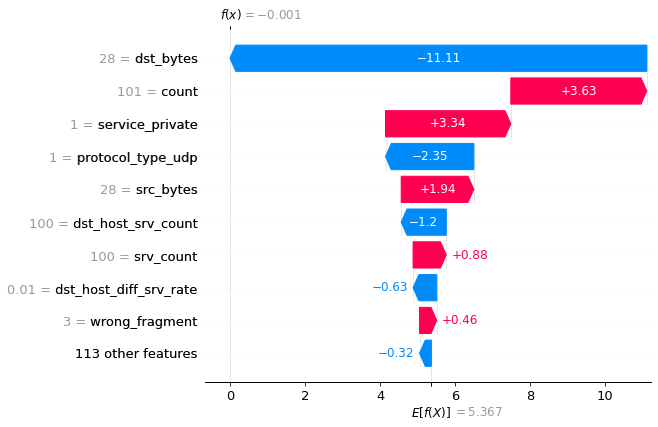

In [23]:
# orig
shap.plots.waterfall(shap_values[632787])

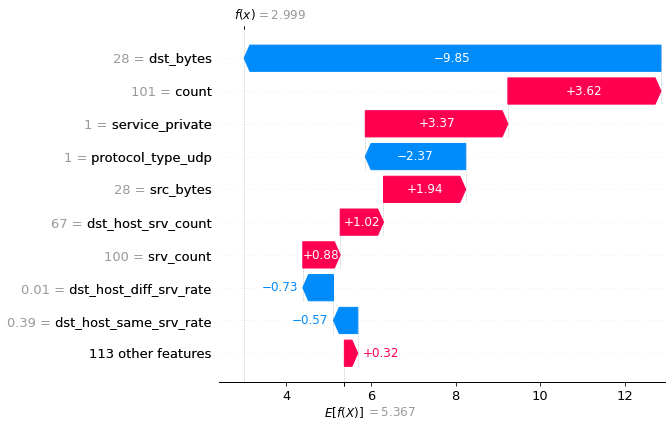

In [24]:
# modified
shap.plots.waterfall(shap_values_mod[632787])

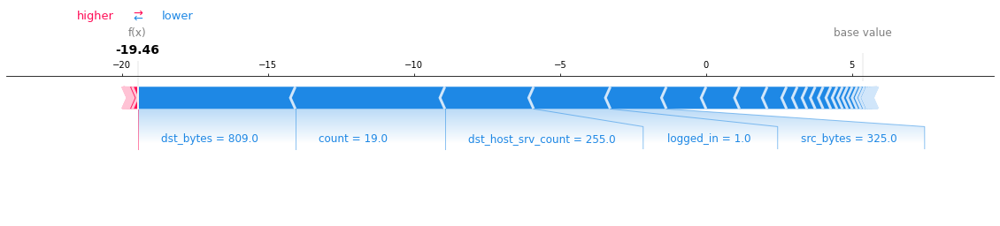

class: 0


In [25]:
point = 360123
shap.force_plot(
    explainer.expected_value,
    shap_values_nd[point, :],
    X.to_numpy()[point, :],
    feature_names= featurenames,
    matplotlib=True
)
print('class:',y_test[360123])

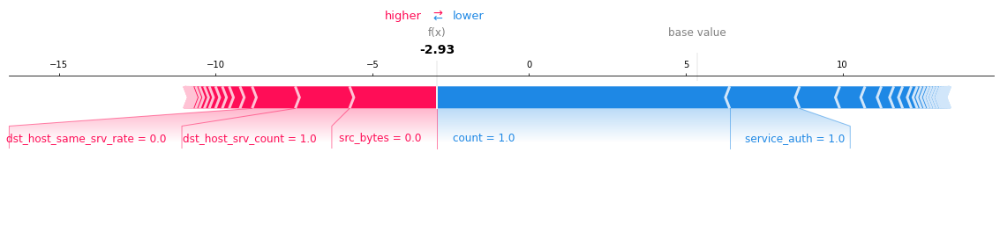

class: 0


In [26]:
point = 12805
shap.force_plot(
    explainer.expected_value,
    shap_values_nd[point, :],
    X.to_numpy()[point, :],
    feature_names= featurenames,
    matplotlib=True)
print('class:', y_test[12805])

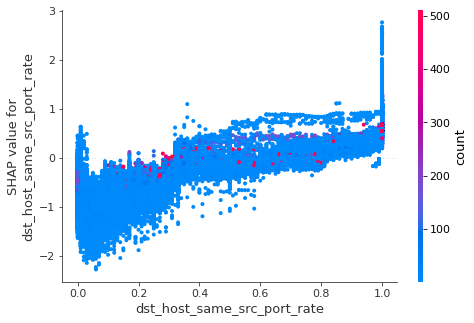

In [27]:
shap.plots.scatter(shap_values[:,"dst_host_same_src_port_rate"], color=shap_values[:,"count"], hist=False)

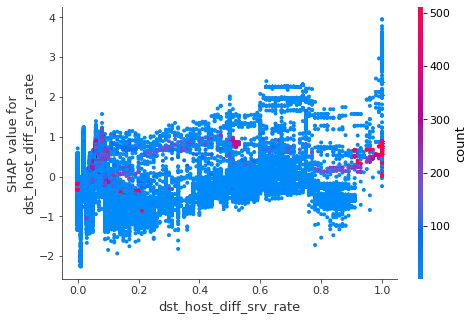

In [28]:
shap.plots.scatter(shap_values[:,"dst_host_diff_srv_rate"], color=shap_values[:,"count"], hist=False)

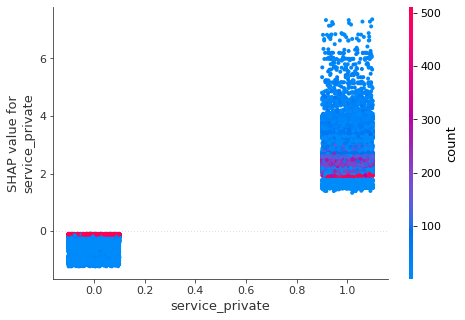

In [29]:
shap.plots.scatter(shap_values[:,"service_private"], color=shap_values[:,"count"], hist=False)

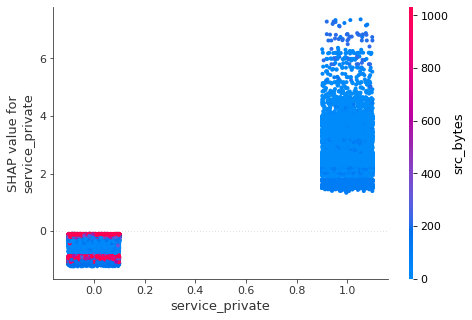

In [30]:
shap.plots.scatter(shap_values[:,"service_private"], color=shap_values[:,"src_bytes"], hist=False)

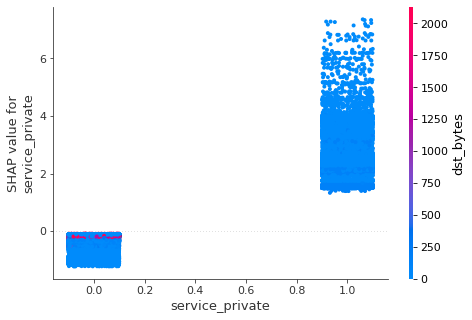

In [51]:
shap.plots.scatter(shap_values[:,"service_private"], color=shap_values[:,"dst_bytes"], hist=False)

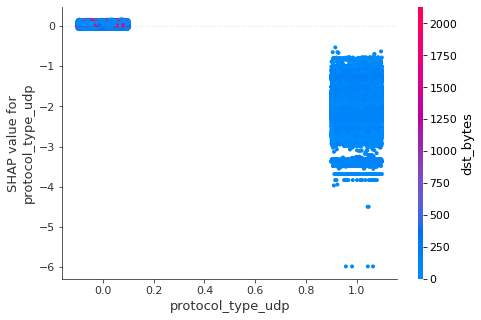

In [31]:
shap.plots.scatter(shap_values[:,"protocol_type_udp"], color=shap_values[:,"dst_bytes"], hist=False)

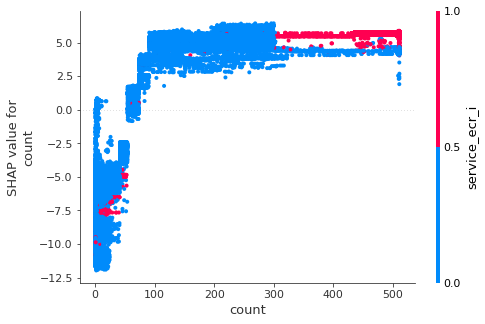

In [32]:
shap.plots.scatter(shap_values[:,"count"], color=shap_values[:,"service_ecr_i"], hist=False)

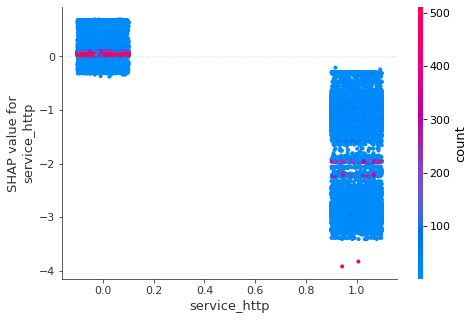

In [33]:
shap.plots.scatter(shap_values[:,"service_http"], color=shap_values[:,"count"],  hist=False, )

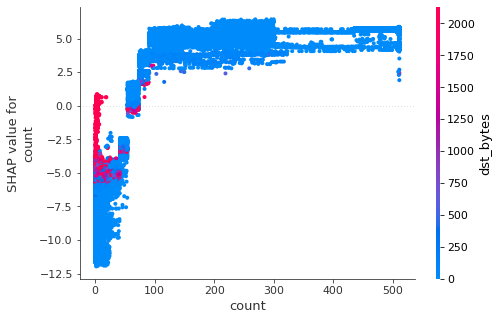

In [34]:
shap.plots.scatter(shap_values[:,"count"], color=shap_values[:,"dst_bytes"], hist=False)

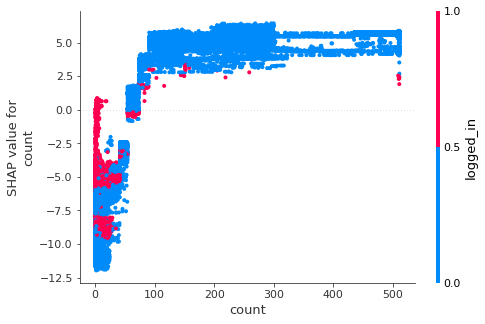

In [35]:
shap.plots.scatter(shap_values[:,"count"], color=shap_values[:,"logged_in"], hist=False)

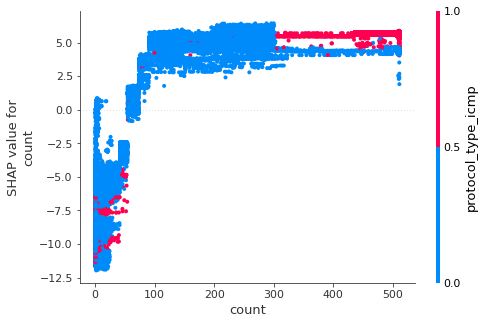

In [36]:
shap.plots.scatter(shap_values[:,"count"], color=shap_values[:,"protocol_type_icmp"], hist=False)

## shap interaction_values

In [37]:
expected_value = explainer.expected_value
print(f"Explainer expected value: {expected_value}")

select = range(140)
features = x_test.iloc[select]
#features_display = X_display.loc[features.index]

#shap_vaxlues = explainer.shap_values(features)[1]
shap_interaction_values = explainer.shap_interaction_values(features) # returns: e.g. for 40 rows: 40x122x122
#shap_interaction_values = shap_interaction_values[1]

Explainer expected value: 5.367182731628418


<Figure size 1440x864 with 0 Axes>

[('count-dst_bytes', 1.6296675205230713), ('count-src_bytes', 1.0368280410766602), ('service_ecr_i-count', 0.8754904866218567), ('protocol_type_icmp-count', 0.8216943740844727), ('dst_host_srv_count-count', 0.5441758632659912), ('count-logged_in', 0.5379628539085388), ('protocol_type_icmp-dst_host_srv_count', 0.4220242500305176), ('service_ecr_i-srv_count', 0.4080757796764374), ('dst_host_diff_srv_rate-src_bytes', 0.3841843605041504), ('dst_host_diff_srv_rate-dst_host_count', 0.36321619153022766), ('dst_host_count-count', 0.3501930832862854), ('protocol_type_icmp-src_bytes', 0.34956100583076477), ('logged_in-src_bytes', 0.340427428483963), ('dst_host_srv_count-src_bytes', 0.33026373386383057), ('srv_count-src_bytes', 0.2920914888381958), ('protocol_type_tcp-src_bytes', 0.25506848096847534), ('dst_host_count-logged_in', 0.24619872868061066), ('service_private-count', 0.23830018937587738), ('dst_host_count-src_bytes', 0.23584017157554626), ('logged_in-dst_bytes', 0.23145389556884766)]




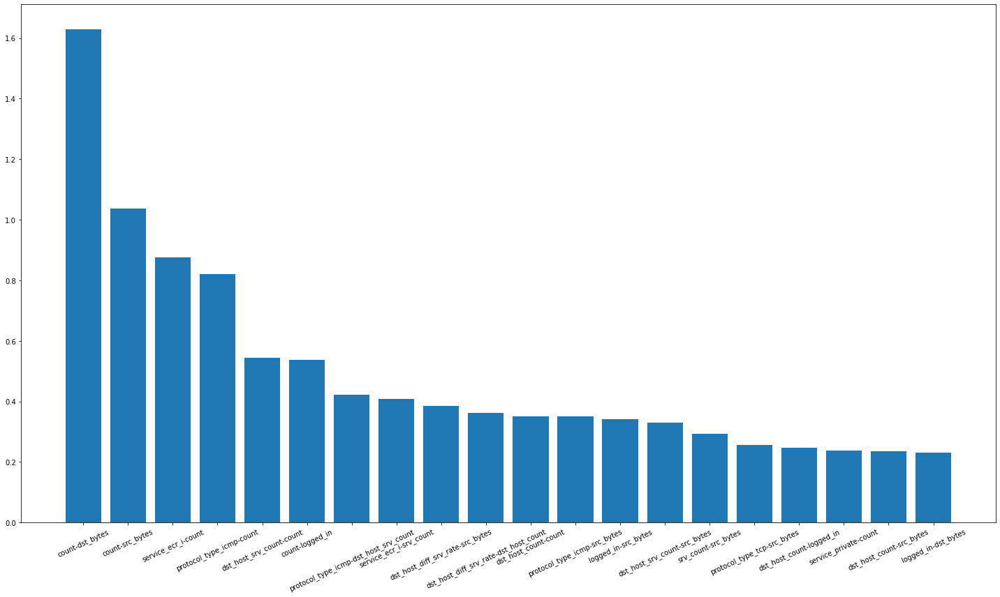

In [38]:
plt.figure(figsize=(20,12))
def plot_top_k_interactions(feature_names, shap_interactions, k):
 # Get the mean absolute contribution for each feature interaction
 aggregate_interactions = np.mean(np.abs(shap_interactions[:, :-1, :-1]), axis=0)
 interactions = []
 for i in range(aggregate_interactions.shape[0]):
     for j in range(aggregate_interactions.shape[1]):
         if j < i:
             interactions.append((feature_names[i] + "-" + feature_names[j], aggregate_interactions[i][j] * 2))
 # sort by magnitude
 interactions.sort(key=lambda x: x[1], reverse=True)
 interaction_features, interaction_values = map(tuple, zip(*interactions))
 #plt.barh(interaction_features[:k], interaction_values[:k])
 plt.bar(interaction_features[:k], interaction_values[:k])
 print(list(zip(interaction_features[:k], interaction_values[:k])),end='\n\n\n')
 plt.xticks(rotation=25)
 plt.tight_layout()
 plt.show()


plot_top_k_interactions(featurenames, shap_interaction_values, 20)

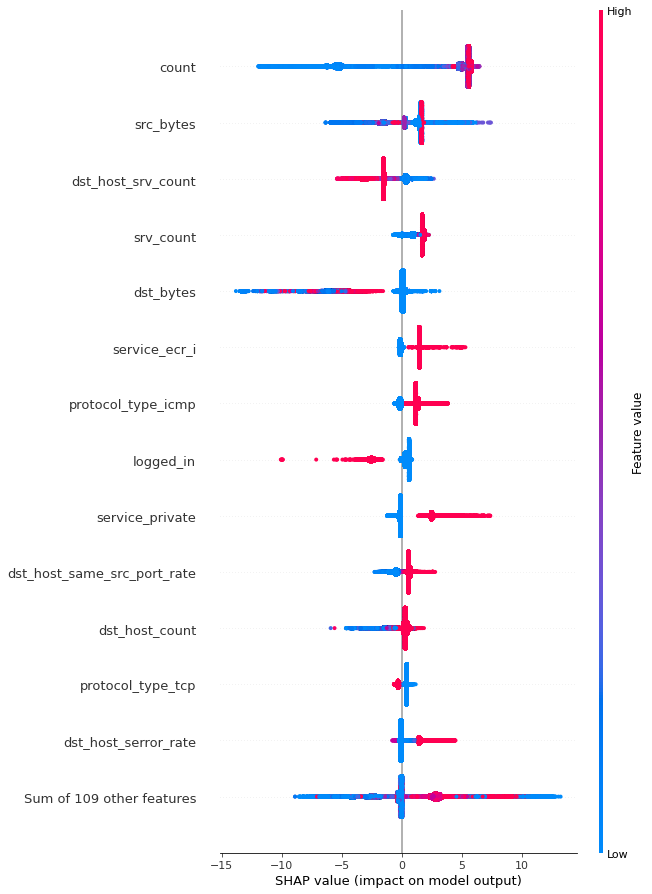

In [39]:
shap.plots.beeswarm(shap_values, plot_size=1.0, max_display=14)

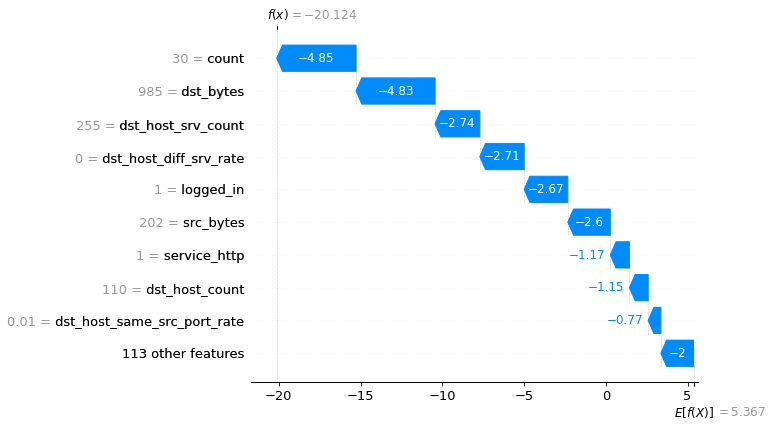

0

2.1376197e-08

In [40]:
shap.plots.waterfall(shap_values[0])
y_test[0]
preds[0]

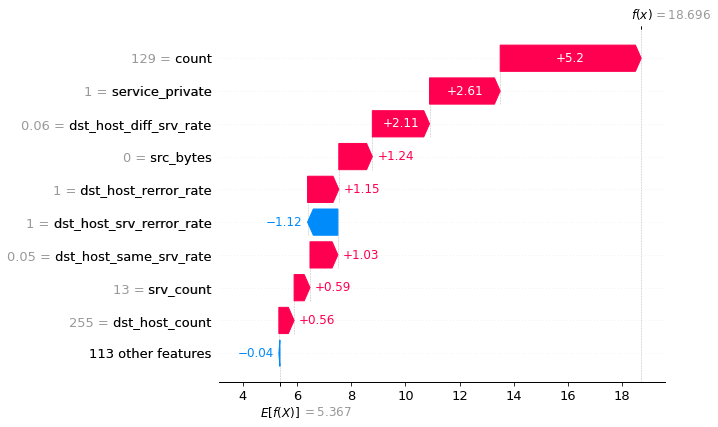

1

1.0

In [41]:
shap.plots.waterfall(shap_values[20])
y_test[20]
preds[20]

duration          0.0
src_bytes         0.0
dst_bytes         0.0
land              0.0
wrong_fragment    0.0
Name: 720952, dtype: float64

12805

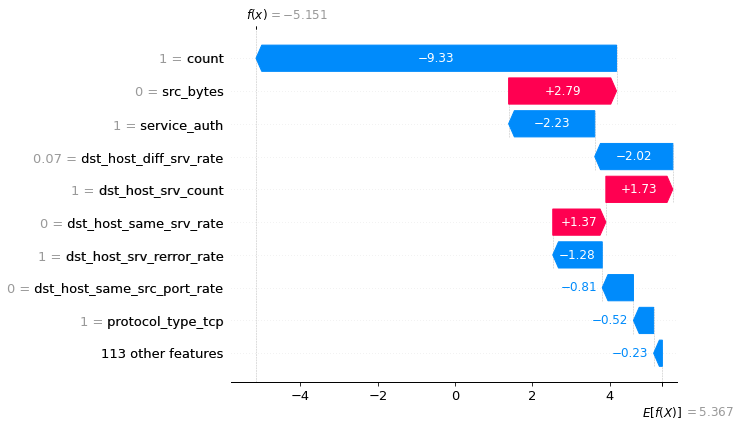

0.050620507

In [42]:
x_test.loc[720952][:5]
x_test.index.get_loc(720952)
shap.plots.waterfall(shap_values[12805])
preds[12805]

In [43]:
shap.initjs()

In [44]:
#shap.force_plot(TREEexplainer.expected_value, TREEshap_values[:1000,:], X.iloc[:1000,:], )
shap.force_plot(explainer.expected_value, shap_values_nd[:100,:], X.iloc[:100,:], )

In [45]:
shap.force_plot(explainer.expected_value, shap_values_nd[19000:20000,:], X.iloc[1900:20000,:], )

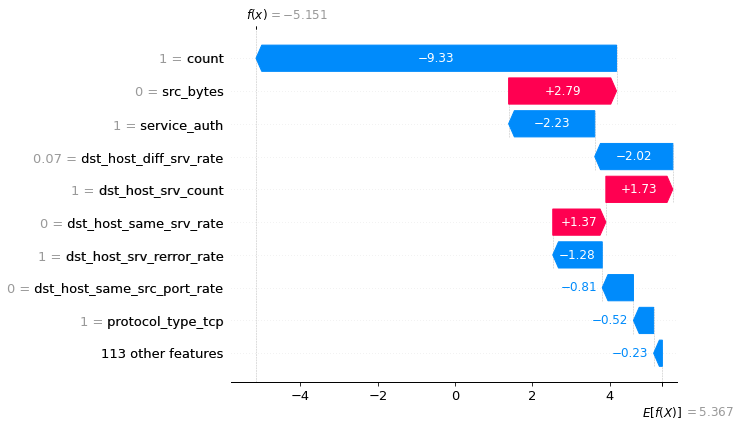

12805

In [46]:
shap.plots.waterfall(shap_values[12805])
x_test.index.get_loc(720952)

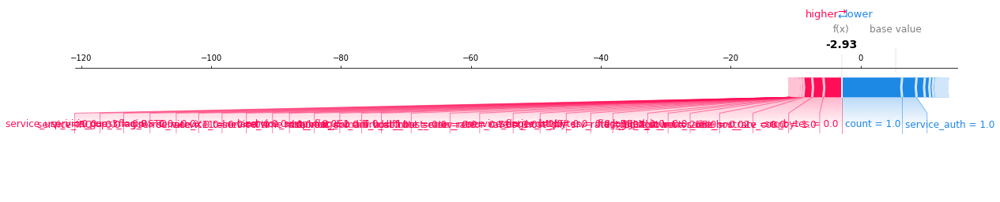

-10.518513

In [47]:
shap.force_plot(explainer.expected_value, shap_values_nd[x_test.index.get_loc(720952),:], X.iloc[x_test.index.get_loc(720952),:], matplotlib=True, contribution_threshold=0.000 )
np.sum(shap_values[12805].values)

In [48]:
# normal should be < 0, most of the misclassified one are close to +0
for i in test_miss_normal.index.values[:5]: # max 5
    shap.force_plot(explainer.expected_value, shap_values_nd[X.index.get_loc(i),:], X.loc[i,:])

In [49]:
print('wrongly classified anomalies as normal are:\n')
for i in target.loc[test_miss_anomaly.index.values]: print(i, end=' ')

wrongly classified anomalies as normal are:

pod. satan. ipsweep. imap. land. rootkit. satan. ipsweep. ipsweep. land. land. satan. spy. ipsweep. ipsweep. guess_passwd. nmap. satan. ipsweep. teardrop. ipsweep. warezmaster. warezclient. satan. satan. ipsweep. land. ipsweep. warezclient. ipsweep. rootkit. warezclient. warezclient. pod. ipsweep. ipsweep. satan. rootkit. ipsweep. ipsweep. 

In [50]:
#anomalies should be > 0 , fewer close to 0
for i in test_miss_anomaly.index.values[:5]: # max 5
    shap.force_plot(explainer.expected_value, shap_values_nd[X.index.get_loc(i),:], X.loc[i,:])
